## Extracting Text from Images in Python

In [8]:
import pandas as pd
import numpy as np
import os
from glob import glob
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
from PIL import Image # python imaging librery

plt.style.use('ggplot')

### Outline
1. Take a look at the data
2. Extract text from images:
    - pytesseract
    - easyocr
    - keras_ocr
3. Run on a few examples and compare the results

In [12]:
os.chdir(r'D:\Sharad Laptop Data 17_08_24\AI_ML\Advanced_AI_ML\pythonProject\OCR')

In [73]:
annot = pd.read_parquet('annot.parquet')
imgs = pd.read_parquet('img.parquet')
img_fns = glob('images/*')


In [83]:
annot.head()

,id,image_id,bbox,utf8_string,points,area
0,a4ea732cd3d5948a_1,a4ea732cd3d5948a,"[525.83, 3.4, 197.64, 33.94]",Performance,"[525.83, 3.4, 723.47, 7.29, 722.76, 36.99, 525...",6707.90
1,a4ea732cd3d5948a_2,a4ea732cd3d5948a,"[534.67, 64.68, 91.22, 38.19]",Sport,"[535.73, 64.68, 623.41, 67.51, 625.89, 102.87,...",3483.69
2,a4ea732cd3d5948a_3,a4ea732cd3d5948a,"[626.95, 63.62, 96.52, 31.82]",Watch,"[626.95, 63.62, 721.7, 63.62, 723.47, 95.44, 6...",3071.27
3,a4ea732cd3d5948a_4,a4ea732cd3d5948a,"[577.4, 141.87, 147.13, 43.1]",...period.,"[580.02, 143.61, 724.53, 141.87, 723.66, 184.9...",6341.30
4,a4ea732cd3d5948a_5,a4ea732cd3d5948a,"[391.03, 163.9, 60.82, 38.65]",.,"[395.2, 163.9, 451.85, 191.94, 445.59, 202.55,...",2350.69


In [85]:
imgs.head()

,id,width,height,set,file_name
0,a4ea732cd3d5948a,840,1024,train,train/a4ea732cd3d5948a.jpg
1,4bf43a7b2a898044,1024,683,train,train/4bf43a7b2a898044.jpg
2,1b55b309b0f50d02,1024,683,train,train/1b55b309b0f50d02.jpg
3,00c359f294f7dcd9,1024,680,train,train/00c359f294f7dcd9.jpg
4,04b5a37f762b0f51,768,1024,train,train/04b5a37f762b0f51.jpg


In [74]:
print(img_fns)

['images\\0000599864fd15b3.jpg', 'images\\0000e8b36676338b.jpg', 'images\\00010bf498b64bab.jpg', 'images\\00012db06b98f573.jpg', 'images\\0002d070329eb0fc.jpg']


### Plot Example Images

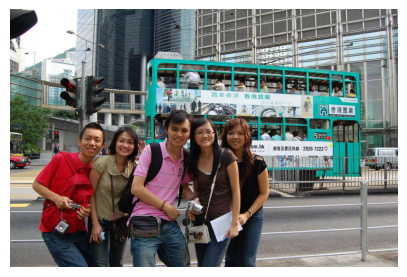

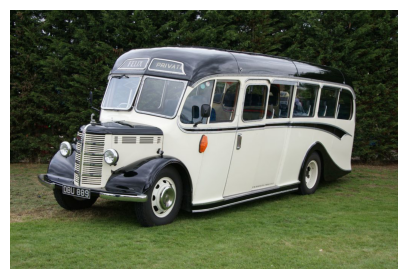

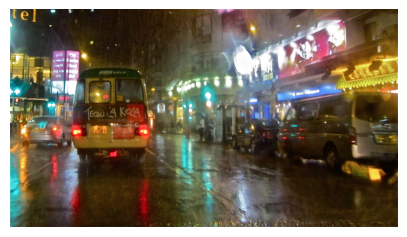

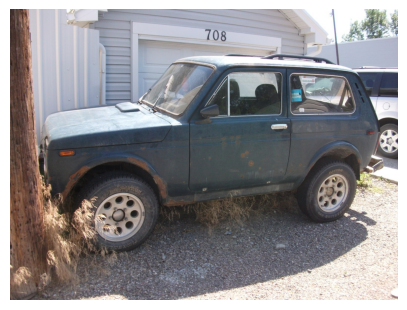

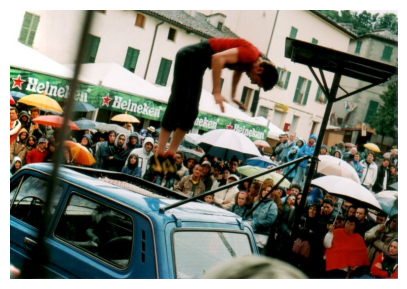

In [77]:
for i in img_fns:
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(plt.imread(i))
    ax.axis('off')
    plt.show()

In [93]:
image_id = img_fns[0].split('/')[-1].split('.')[0]
annot.query('image_id == @image_id')

,id,image_id,bbox,utf8_string,points,area


## Display for first 25 images

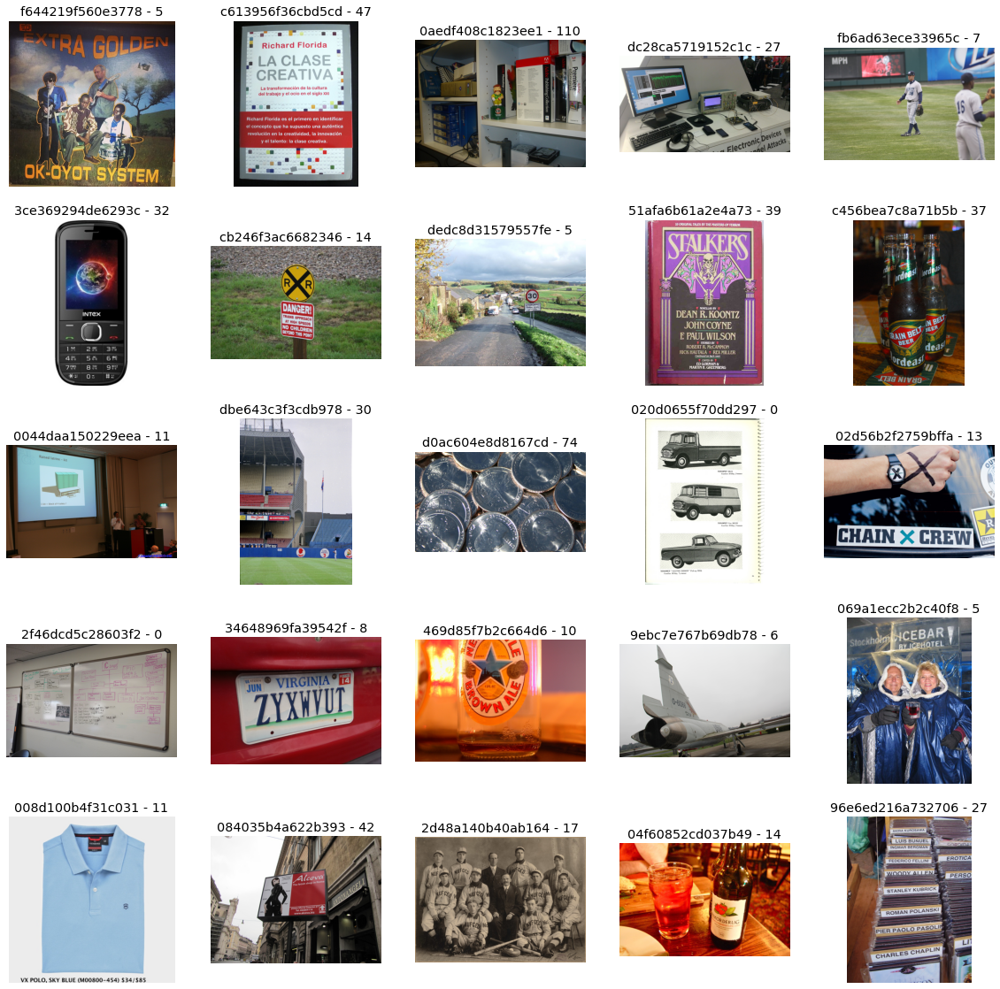

In [5]:
fig, axs = plt.subplots(5, 5, figsize=(20, 20))
axs = axs.flatten()
for i in range(5):
    axs[i].imshow(plt.imread(img_fns[i]))
    axs[i].axis('off')
    image_id = img_fns[i].split('/')[-1].rstrip('.jpg')
    n_annot = len(annot.query('image_id == @image_id'))
    axs[i].set_title(f'{image_id} - {n_annot}')
plt.show()

# Method 1: pytesseract

In [1]:
# !pip install pytesseract
import pytesseract

# Example call
print(pytesseract.image_to_string(img_fns[1], lang='eng'))

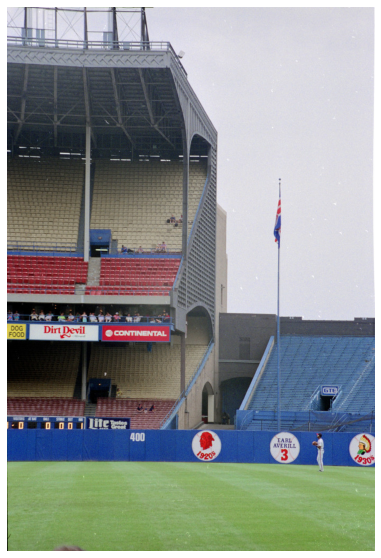

In [7]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(plt.imread(img_fns[11]))
ax.axis('off')
plt.show()

# Method 2: easyocr

In [8]:
import easyocr

reader = easyocr.Reader(['en'], gpu = True)

In [9]:
results = reader.readtext(img_fns[11])

In [10]:
pd.DataFrame(results, columns=['bbox','text','conf'])

,bbox,text,conf
0,"[[2, 598], [36, 598], [36, 626], [2, 626]]",D,0.120065
1,"[[65, 595], [150, 595], [150, 627], [65, 627]]",Dirtpevil,0.713812
2,"[[201, 607], [303, 607], [303, 623], [201, 623]]",CONIINENTAL,0.422955
3,"[[150, 772], [230, 772], [230, 798], [150, 798]]",Wctt,0.028402
4,"[[228, 798], [262, 798], [262, 822], [228, 822]]",400,0.999471
5,"[[507, 811], [539, 811], [539, 823], [507, 823]]",EARL,0.993944
6,"[[499, 819], [547, 819], [547, 833], [499, 833]]",AVERILL,0.998245
7,"[[361, 839], [389, 839], [389, 853], [361, 853]]",920,0.999452
8,"[[656, 844], [692, 844], [692, 864], [656, 864]]",9303,0.401455


# Method 3: keras_ocr

In [11]:
!pip install keras-ocr -q

In [12]:
import keras_ocr

pipeline = keras_ocr.pipeline.Pipeline()

Looking for /root/.keras-ocr/craft_mlt_25k.h5


2022-07-09 21:03:01.540686: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-09 21:03:01.541799: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-09 21:03:01.542440: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-09 21:03:01.543182: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

Looking for /root/.keras-ocr/crnn_kurapan.h5


In [13]:
results = pipeline.recognize([img_fns[11]])

2022-07-09 21:03:07.749275: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-07-09 21:03:08.598788: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


In [14]:
pd.DataFrame(results[0], columns=['text', 'bbox'])

,text,bbox
0,dog,"[[6.0, 599.0], [31.0, 599.0], [31.0, 610.0], [..."
1,dirt,"[[67.53808, 597.46704], [104.066, 600.0762], [..."
2,devil,"[[101.0, 600.0], [149.0, 600.0], [149.0, 622.0..."
3,continental,"[[200.06012, 606.7333], [302.16663, 608.1714],..."
4,food,"[[2.0, 611.0], [34.0, 611.0], [34.0, 623.0], [..."
5,gte,"[[595.0, 718.0], [619.0, 718.0], [619.0, 726.0..."
6,litersts,"[[152.32657, 772.63214], [228.6387, 776.5456],..."
7,400,"[[230.0, 800.0], [261.0, 800.0], [261.0, 819.0..."
8,earl,"[[507.10864, 809.71954], [536.4231, 811.1154],..."
9,averill,"[[500.0, 821.0], [545.0, 821.0], [545.0, 831.0..."


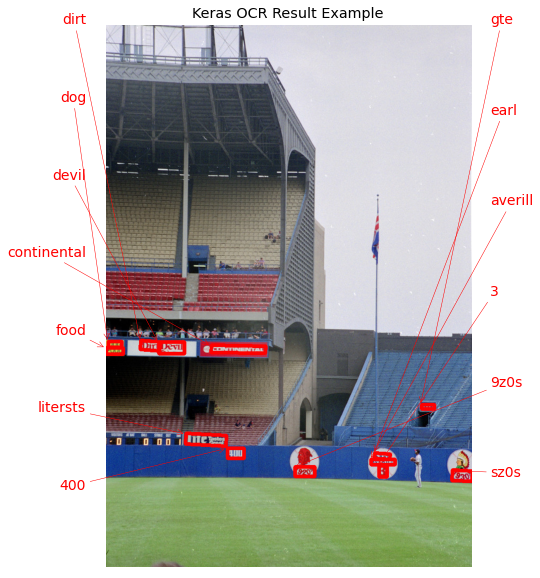

In [15]:
fig, ax = plt.subplots(figsize=(10, 10))
keras_ocr.tools.drawAnnotations(plt.imread(img_fns[11]), results[0], ax=ax)
ax.set_title('Keras OCR Result Example')
plt.show()

# Compare easyocr vs. keras_ocr

In [16]:
# easyocr
reader = easyocr.Reader(['en'], gpu = True)

dfs = []
for img in tqdm(img_fns[:25]):
    result = reader.readtext(img)
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['bbox','text','conf'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
easyocr_df = pd.concat(dfs)

  0%|          | 0/25 [00:00<?, ?it/s]

In [17]:
# keras_ocr
pipeline = keras_ocr.pipeline.Pipeline()

dfs = []
for img in tqdm(img_fns[:25]):
    results = pipeline.recognize([img])
    result = results[0]
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['text', 'bbox'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
kerasocr_df = pd.concat(dfs)

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


  0%|          | 0/25 [00:00<?, ?it/s]

# Plot Results: easyocr vs keras_ocr

In [18]:
def plot_compare(img_fn, easyocr_df, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    easy_results = easyocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    easy_results = [(x[0], np.array(x[1])) for x in easy_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    easy_results, ax=axs[0])
    axs[0].set_title('easyocr results', fontsize=24)

    keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    keras_results, ax=axs[1])
    axs[1].set_title('keras_ocr results', fontsize=24)
    plt.show()

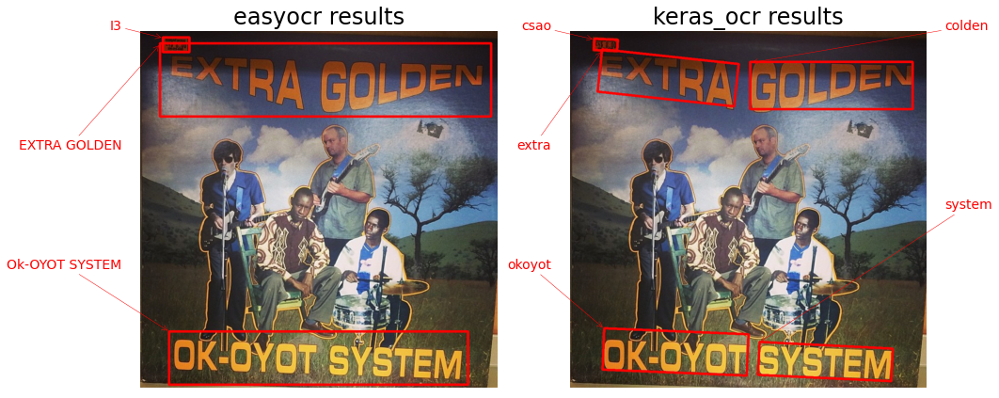

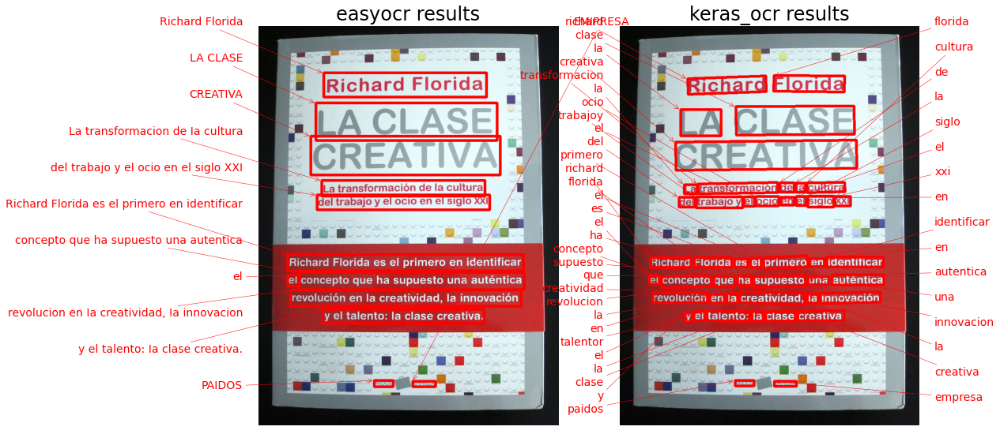

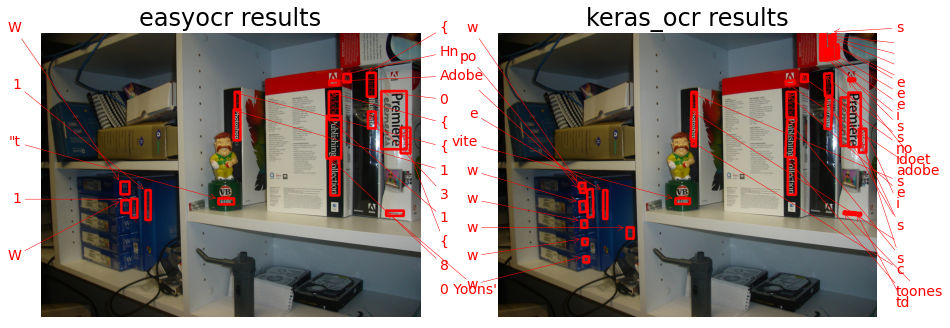

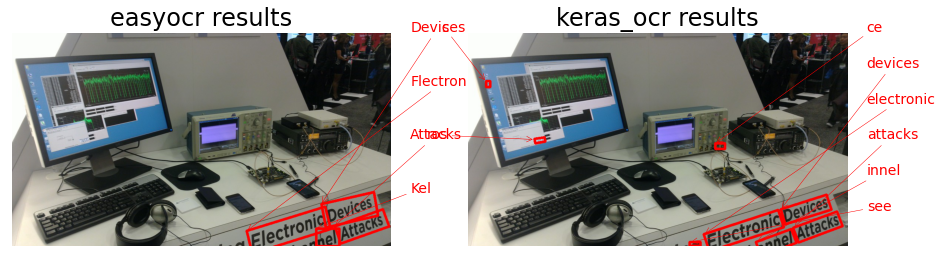

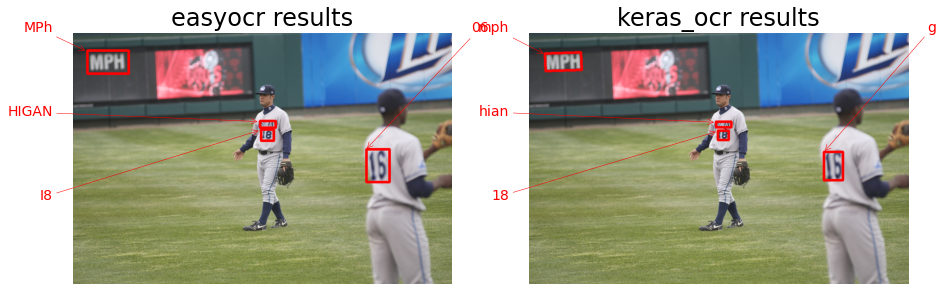

...

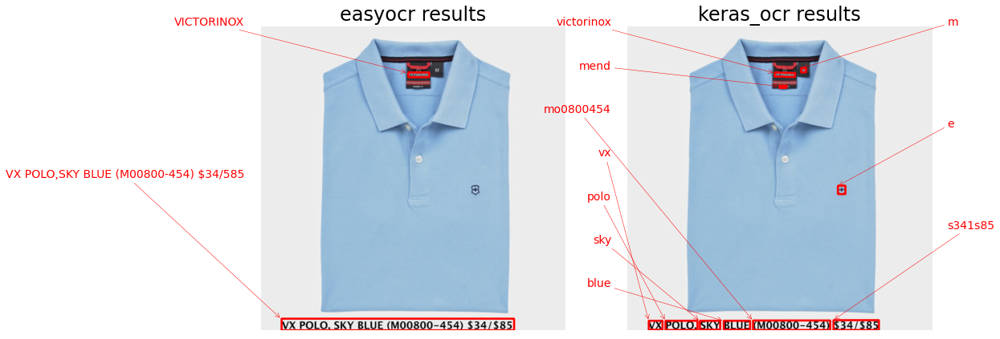

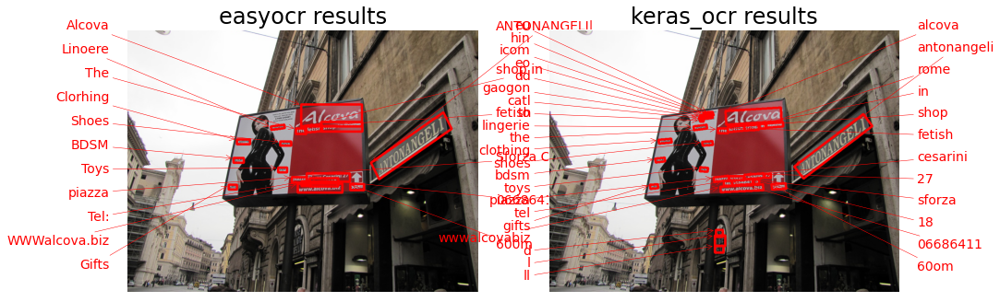

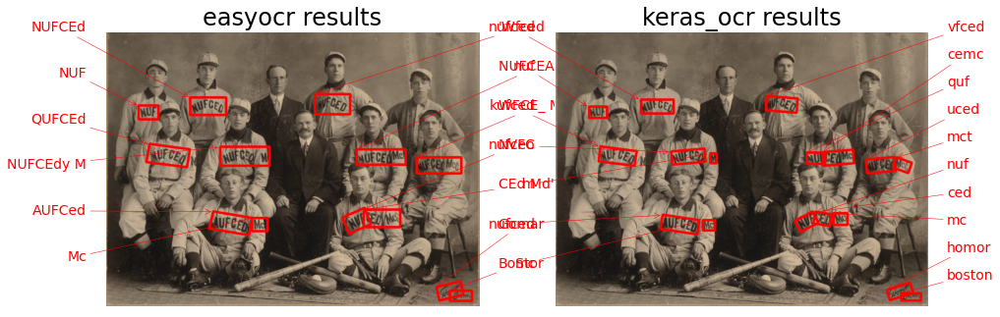

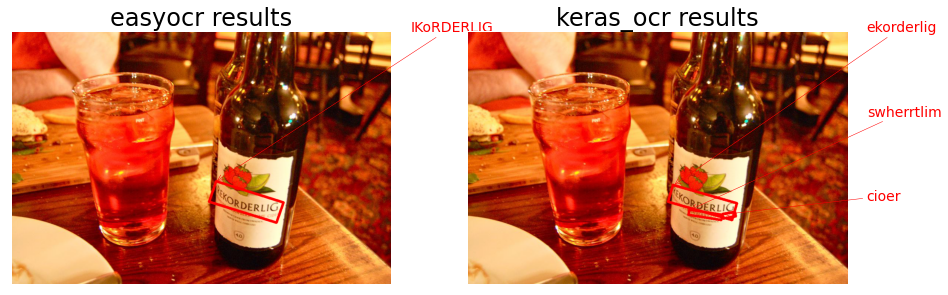

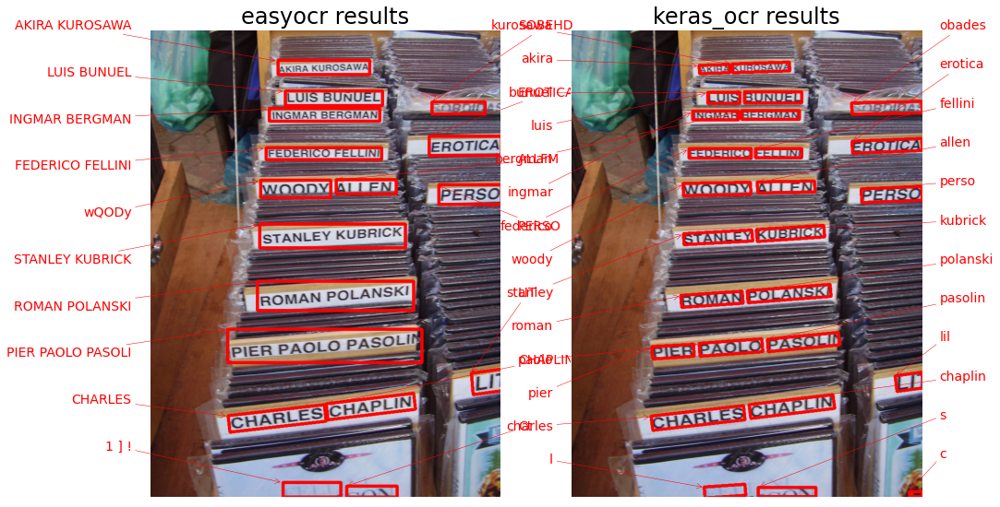

In [19]:
# Loop over results
for img_fn in img_fns[:25]:
    plot_compare(img_fn, easyocr_df, kerasocr_df)

# The End